In [146]:
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
%matplotlib inline

### Upload collected background files, positive and negative sounds

In [147]:
for file_name in os.listdir('./raw_data/background'):
    if file_name.lower().endswith('.wav'):
        file_path = os.path.join('./raw_data/background', file_name)
        audio = AudioSegment.from_file(file_path)

        # Check duration in milliseconds
        duration_ms = len(audio)
        
        # Check if duration is exactly 10000 ms (10 seconds)
        if duration_ms != 10000:
            print(f"Removing {file_name} with duration {duration_ms} ms")
            os.remove(file_path)

In [148]:
IPython.display.Audio("./raw_data/alexa/1.wav")

In [149]:
IPython.display.Audio("./raw_data/negative/academy.wav")

In [150]:
IPython.display.Audio("./raw_data/background/1_0.wav")

#### Define the limitations of the data format

In [151]:

Tx = 5511 # The number of time steps input to the model (spectrogram)
n_freq = 101 # Number of frequencies input to the model at each time step (spectrogram)
Ty = 1375 # The number of time steps in the output
np.random.seed(42)

In [152]:
# Load raw audio files and resample
def load_audio_files(path, target_rate=44100):
    alexa = []
    negative = []
    background = []

    for file in os.listdir(path + 'alexa'):
        if file.lower().endswith('wav'):
            alex = AudioSegment.from_wav(path + "alexa/" + file)
            alex = resample_audio(alex, target_rate)
            alexa.append(alex)
    for file in os.listdir(path + 'negative'):
        if file.lower().endswith('wav'):
            neg = AudioSegment.from_wav(path + "negative/" + file)
            neg = resample_audio(neg, target_rate)
            negative.append(neg)
    for file in os.listdir(path + 'background'):
        if file.lower().endswith('wav'):
            back = AudioSegment.from_wav(path + "background/" + file)
            back = resample_audio(back, target_rate)
            background.append(back)  
    
    return alexa, negative, background

def resample_audio(audio_segment, target_rate=44100):
    return audio_segment.set_frame_rate(target_rate)

#### Visualize the lengths

In [153]:
# Load audio segments using pydub 
#alexa, negative, background = load_raw_audio('./raw_data/')

alexa, negative, background = load_audio_files('./raw_data/', 44100)

print("background len is 10,000, since the background sounds are sliced to 10 seconds audios\n" + str(len(background[72])),"\n")
print("different `alexa` clips can have different lengths\n" + str(len(alexa[1])) + ' or ' + str(len(alexa[2])),"\n")
print("different `negative` clips can have different lengths as well \n" + str(len(negative[1])) + ' or ' + str(len(negative[5])),"\n")

background len is 10,000, since the background sounds are sliced to 10 seconds audios
10000 

different `alexa` clips can have different lengths
1680 or 1840 

different `negative` clips can have different lengths as well 
880 or 1395 



### Process the audio files

#### Take a random time segment and lookup if it is empty

In [154]:
def get_random_time_segment(segment):
    
    #Gets a random time segment of duration segment_ms in an audio clip.
    segment_start = np.random.randint(low=0, high=10000-segment)
    segment_end = segment_start + segment - 1
    
    return (segment_start, segment_end)

In [155]:
# example of the random segment where alexa[2] is inserted
random_segment = get_random_time_segment(len(alexa[2]))
print(random_segment)

(7270, 9109)


In [156]:
def is_overlap(segment_time, previous_segments):

    segment_start, segment_end = segment_time

    flag = False

    for prev_segment_start, prev_segment_end in previous_segments:
        if segment_start <= prev_segment_end and segment_end >= prev_segment_start:
            
            flag = True
            break
    return flag

In [157]:
# example of the random segment in the list

random_segment = get_random_time_segment(len(alexa[2]))
random_segment_2 = [value+3000 for value in random_segment]
list_segment = []
list_segment.append(random_segment)

In [158]:
random_segment

(7603, 9442)

In [159]:
random_segment_2

[10603, 12442]

In [160]:
is_overlap(random_segment_2, list_segment)

False

In [161]:
def insert_audio_clip(background, audio_clip, previous_segments):
    
    segment_ms = len(audio_clip)
    segment_time = get_random_time_segment(segment_ms)
    
    retry = 5 
    while is_overlap(segment_time, previous_segments) and retry >= 0:
        segment_time = get_random_time_segment(segment_ms)
        retry = retry - 1
        print(segment_time)

    if not is_overlap(segment_time, previous_segments):
        previous_segments.append(segment_time)
        new_background = background.overlay(audio_clip, position = segment_time[0])
    else:
        print('Timeout')
        new_background = background
        segment_time = (10000, 10000)
    
    return new_background, segment_time

In [162]:
background_0 = background[0]
audio_0 = alexa[0]
previous_segments = [(3790, 4400)]

new_back, random_seg = insert_audio_clip(background_0, audio_0, previous_segments)

#### In 'alexa' sound is inserted in the available time segment -- mark it in the label data with 1's

In [163]:
def insert_ones(y, audio_end):

    # number of time steps in the output
    _,Ty = y.shape

    # transform audio_end from ms to output time steps
    audio_end_y = int((audio_end * Ty)/10000)

    if audio_end_y < Ty:
        for i in range(50):
            if audio_end_y+i+1 < Ty:
                y[0][audio_end_y+i+1] = 1
            else:
                break
            
    return y
    

In [164]:
y = np.zeros((1, Ty))
audio_end = 5530

insert_ones(y, audio_end)


array([[0., 0., 0., ..., 0., 0., 0.]])

In [165]:
y[0][762]
print(y[0].shape)

(1375,)


In [166]:
# check if exactly 50 ones added
counter = 0
for i in range(60):
    if y[0][760+i] == 1.0:
        counter += 1

print(counter)

50


### Create training examples

In [323]:
import matplotlib.pyplot as plt
from scipy.io import wavfile

#####Helper functions from the project
# Calculate and plot spectrogram for a wav audio file
def graph_spectrogram(wav_file):
    rate, data = get_wav_info(wav_file)
    nfft = 200  # Length of each window segment
    fs = 8000  # Sampling frequencies
    noverlap = 120  # Overlap between windows
    nchannels = data.ndim

    if nchannels == 1:
        pxx, freqs, bins, im = plt.specgram(data, NFFT=nfft, Fs=fs, noverlap=noverlap)
    elif nchannels == 2:
        pxx, freqs, bins, im = plt.specgram(data[:, 0], NFFT=nfft, Fs=fs, noverlap=noverlap)
    # Print debug information
    print(f"rate: {rate}, data shape: {data.shape}")
    print(f"pxx shape: {pxx.shape}, freqs shape: {freqs.shape}, bins shape: {bins.shape}")
    
    return pxx

# Load a wav file
def get_wav_info(wav_file):
    rate, data = wavfile.read(wav_file)
    return rate, data

# Used to standardize volume of audio clip
def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

# Load raw audio files for speech synthesis
def load_raw_audio(path):
    activates = []
    backgrounds = []
    negatives = []
    for filename in os.listdir(path + "activates"):
        if filename.endswith("wav"):
            activate = AudioSegment.from_wav(path + "activates/" + filename)
            activates.append(activate)
    for filename in os.listdir(path + "backgrounds"):
        if filename.endswith("wav"):
            background = AudioSegment.from_wav(path + "backgrounds/" + filename)
            backgrounds.append(background)
    for filename in os.listdir(path + "negatives"):
        if filename.endswith("wav"):
            negative = AudioSegment.from_wav(path + "negatives/" + filename)
            negatives.append(negative)
    return activates, negatives, backgrounds


def create_training_sample(single_background, alexa, negative, Ty):
    
    background = single_background - 20
    y = np.zeros((1,Ty))
    previous_segments = []


    num_alexa = random.randint(1,4)
    indices_alexa = np.random.randint(len(alexa), size=num_alexa)
    alexa_samples = [alexa[i] for i in indices_alexa]

    for alexa_sample in alexa_samples:
        background, alexa_sample_new = insert_audio_clip(background, alexa_sample, previous_segments)
        _, alexa_sample_new_end = alexa_sample_new
        insert_ones(y,alexa_sample_new_end)

    num_negative = random.randint(0,4)
    indices_negative = np.random.randint(len(negative), size=num_negative)
    negative_samples = [negative[i] for i in indices_negative]

    for negative_sample in negative_samples:
        background, _ = insert_audio_clip(background, negative_sample, previous_segments)

    print(len(background))
    background = match_target_amplitude(background, -20.0)
    
    file = background.export('train' + '.wav', format='wav')
    x = graph_spectrogram('train.wav')
    
    return x,y

(4120, 6959)
(4777, 7616)
(5265, 8104)
(669, 3508)
(2833, 5672)
(1670, 4509)
Timeout
(5508, 6787)
(4292, 5571)
(2464, 3743)
(4483, 5877)
(7820, 9214)
10000
rate: 44100, data shape: (441000, 2)
pxx shape: (101, 5511), freqs shape: (101,), bins shape: (5511,)


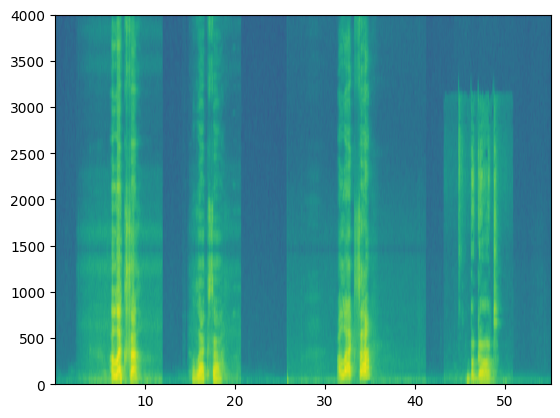

In [324]:
x, y = create_training_sample(background[2], alexa, negative, Ty)

In [302]:
print(x.shape)
print(y.shape)

(101, 5511)
(1, 1375)


rate: 44100, data shape: (441000,)
pxx shape: (101, 5511), freqs shape: (101,), bins shape: (5511,)


(101, 5511)

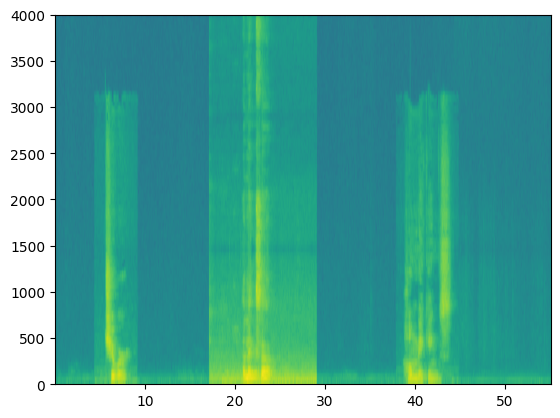

In [210]:
graph_spectrogram('train.wav').shape

In [211]:
IPython.display.Audio("train.wav")

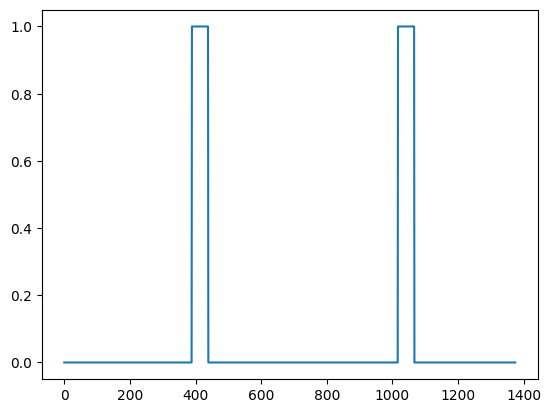

In [172]:
plt.plot(y[0])

0
(7476, 9435)
(6949, 8148)
(2433, 3632)
(1184, 2044)
(4555, 5415)
(3385, 4245)
(6396, 7256)
(8666, 9526)
(2558, 3418)
Timeout
10000
rate: 44100, data shape: (441000,)
pxx shape: (101, 5511), freqs shape: (101,), bins shape: (5511,)
(101, 5511)
(3005, 4004)
(4658, 5657)
(7734, 9933)
(3556, 4408)
(5393, 6661)
(8433, 9701)
(7513, 8781)
(2612, 3880)
(7041, 8309)
(6235, 7503)
10000
rate: 44100, data shape: (441000,)
pxx shape: (101, 5511), freqs shape: (101,), bins shape: (5511,)
(101, 5511)
(3152, 4204)
(7555, 8773)
(3073, 4291)
(1021, 2239)
(3843, 5061)
(7989, 9207)
(6873, 8091)
Timeout
10000
rate: 44100, data shape: (441000, 2)
pxx shape: (101, 5511), freqs shape: (101,), bins shape: (5511,)
(101, 5511)
(7892, 9192)
(6863, 8163)
(7916, 9216)
(8529, 9829)
(878, 2178)
(4887, 6187)
Timeout
10000
rate: 44100, data shape: (441000,)
pxx shape: (101, 5511), freqs shape: (101,), bins shape: (5511,)
(101, 5511)
(2062, 2941)
10000
rate: 44100, data shape: (441000, 2)
pxx shape: (101, 5511), freqs

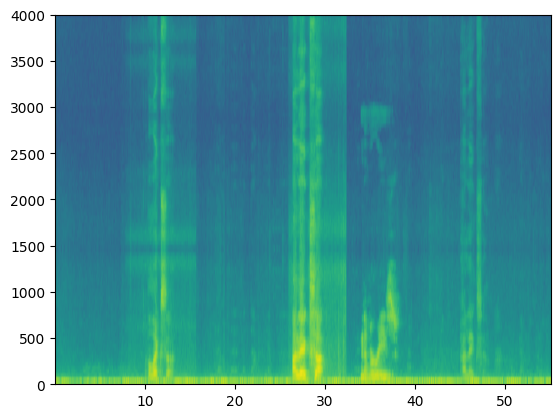

In [173]:
nsamples = 4000
X = []
Y = []
for i in range(0, nsamples):
    if i%10 == 0:
        print(i)
    a = random.randint(0, len(background)-1)
    background_current = background[a]
    create_training_sample(background_current, alexa, negative, Ty)
    X.append(x.swapaxes(0,1))
    print(x.shape)
    Y.append(y.swapaxes(0,1))
X = np.array(X)
Y = np.array(Y)

#### Load saved data

In [174]:
#X= np.load(f'/media/data/uv/X.npy')
#Y= np.load(f'Y.npy')
X_new = X
Y_new = Y

In [ ]:
#X_combined = np.concatenate((X, X_1), axis=0)
#Y_combined = np.concatenate((Y, Y_1), axis=0)

# Optionally, save the combined data
#np.save("./XY/X_combined.npy", X_combined)
#np.save("./XY/Y_combined.npy", Y_combined)

#print(f"Combined X shape: {X_combined.shape}")
#print(f"Combined Y shape: {Y_combined.shape}")

### Start training

In [226]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, TimeDistributed, Conv1D
from tensorflow.keras.layers import BatchNormalization, LSTM
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import binary_crossentropy


In [274]:
def modelf(input_shape):
    X_input = Input(shape = input_shape)

    X = Conv1D(filters = 256, kernel_size=15, strides=4)(X_input)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = Dropout(rate=0.6)(X)

    X = LSTM(units=256, return_sequences=True)(X)
    X = Dropout(rate=0.6)(X)
    X = BatchNormalization()(X)
    #X = Dropout(rate=0.6)(X)

    X = LSTM(units=128, return_sequences=True)(X)
    X = Dropout(rate=0.6)(X)
    X = BatchNormalization()(X)

    X = Dense(64, activation='relu')(X)
    X = BatchNormalization()(X)
    X = Dropout(rate=0.6)(X)

    X = TimeDistributed(Dense(1, activation='sigmoid'))(X)

    model = Model(inputs=X_input, outputs=X)

    return model

In [275]:
model = modelf(input_shape = (Tx, n_freq))

In [276]:
model.summary()

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 5511, 101)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_8 (Conv1D)               │ (None, 1375, 256)      │       388,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_32          │ (None, 1375, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_8 (Activation)       │ (None, 1375, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 1375, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_16 (LSTM)                  │ (None, 1375, 256)      │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 1375, 256)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_33          │ (None, 1375, 256)      │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_17 (LSTM)                  │ (None, 1375, 128)      │       197,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_34 (Dropout)            │ (None, 1375, 128)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_34          │ (None, 1375, 128)      │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 1375, 64)       │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_35          │ (None, 1375, 64)       │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_35 (Dropout)            │ (None, 1375, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ time_distributed_8              │ (None, 1375, 1)        │            65 │
│ (TimeDistributed)               │                        │               │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,121,665 (4.28 MB)

 Trainable params: 1,120,257 (4.27 MB)

 Non-trainable params: 1,408 (5.50 KB)

In [234]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_new, Y_new, test_size=0.2, random_state=42)

In [265]:
y_train.shape

(3200, 1375, 1)

In [266]:
Y=y_train.ravel()
counts_pos = np.sum(Y)
counts_neg = len(Y) - counts_pos
print(f"In the training data there are {counts_neg} 0's")
print(f"In the training data there are {counts_pos} 1's")

In the training data there are 4080000.0 0's
In the training data there are 320000.0 1's


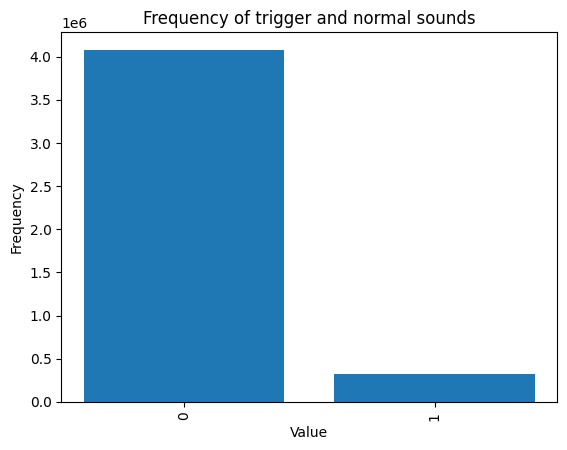

In [267]:
plt.bar(x=[0, 1], height=[counts_neg, counts_pos])
plt.xticks([0, 1], ['0', '1'], rotation=90)
plt.xlabel('Value')
plt.ylabel('Frequency')
plt.title('Frequency of trigger and normal sounds')
plt.show()

In [268]:
# Count frequencies
freq_pos = counts_pos / len(Y)
freq_neg = counts_neg / len(Y)
print(f"In the training data frequency of 0's is {freq_neg} ")
print(f"In the training data frequency if  1's is {freq_pos}")

In the training data frequency of 0's is 0.9272727272727272 
In the training data frequency if  1's is 0.07272727272727272


In [270]:
weight_neg = len(Y) / (counts_neg * 2)
weight_pos = len(Y) / (counts_pos * 2)
class_weight = {0: weight_neg, 1: weight_pos}

print(f"In the training data weight for the 0's is {weight_neg}")
print(f"In the training data weight for the 1's is {weight_pos}")

In the training data weight for the 0's is 0.5392156862745098
In the training data weight for the 1's is 6.875


In [271]:
# set the weights for the unbalanced classes
def weighted_binary_crossentropy(y_true, y_pred):
   
    y_true_flat = tf.reshape(y_true, [-1])
    y_pred_flat = tf.reshape(y_pred, [-1])
    
    bce = binary_crossentropy(y_true_flat, y_pred_flat)
    
    weight_vector = tf.where(tf.equal(y_true_flat, 1), class_weight[1], class_weight[0])
    weight_vector = tf.cast(weight_vector, dtype=tf.float32)
    weighted_bce = bce * weight_vector
    
    return tf.reduce_mean(weighted_bce)


In [277]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.metrics import AUC

opt = Adam(learning_rate=2e-5)

model.compile(
    loss=weighted_binary_crossentropy,
    optimizer=opt,
    metrics = [AUC(name='auc')]
)


In [278]:

checkpoint_callback = ModelCheckpoint(
    filepath='model{epoch:02d}.weights.h5',
    save_weights_only=True,
    save_freq=1500,  
    verbose=1     
)

history = model.fit(
    X_train, y_train,
    epochs=30,    
    batch_size=10,
    callbacks=[checkpoint_callback])


Epoch 1/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 85s 164ms/step - auc: 0.5116 - loss: 1.0050
Epoch 2/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 82s 164ms/step - auc: 0.5229 - loss: 0.8420
Epoch 3/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 57s 179ms/step - auc: 0.5275 - loss: 0.7787
Epoch 4/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 54s 169ms/step - auc: 0.5324 - loss: 0.7361
Epoch 5/30
219/320 ━━━━━━━━━━━━━━━━━━━━ 16s 165ms/step - auc: 0.5410 - loss: 0.6962
Epoch 5: saving model to model05.weights.h5
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 166ms/step - auc: 0.5415 - loss: 0.6932
Epoch 6/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 81s 163ms/step - auc: 0.5488 - loss: 0.6566
Epoch 7/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - auc: 0.5524 - loss: 0.6254
Epoch 8/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - auc: 0.5590 - loss: 0.5957
Epoch 9/30
320/320 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - auc: 0.5637 - loss: 0.5669
Epoch 10/30
119/320 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - auc: 0.5684 - loss: 0.5416
Epoch 10: saving model to model10.weights.

In [124]:
y_test.shape

(800, 1375, 1)

In [ ]:
X_train.shape

### Inference phase

In [280]:
loss, auc = model.evaluate(X_test, y_test)
print("Test set loss = ", loss)
print("Test set auc = ", auc)

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 81ms/step - auc: 0.8829 - loss: 0.1469
Test set loss =  0.1469101458787918
Test set auc =  0.8829177021980286


rate: 44100, data shape: (441000, 2)
pxx shape: (101, 5511), freqs shape: (101,), bins shape: (5511,)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step


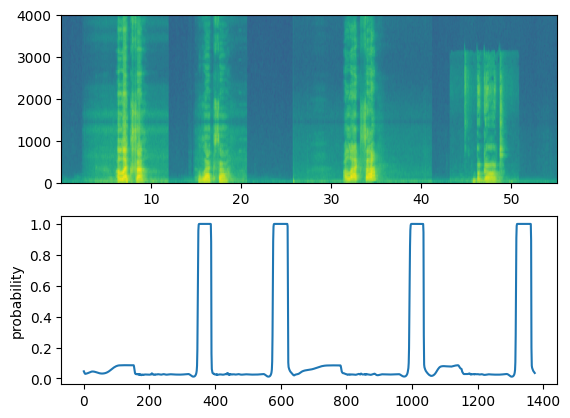

array([[[0.04627373],
        [0.04186494],
        [0.0359625 ],
        ...,
        [0.04151969],
        [0.03867607],
        [0.03542927]]], dtype=float32)

In [325]:
# test on newly generated test samples
# see function create_training_sample
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    
    audio_clip = AudioSegment.from_wav(filename)
    audio_clip = match_target_amplitude(audio_clip, -20.0)
    audio_clip = resample_audio(audio_clip, target_rate=44100)
    _ = audio_clip.export("test_out.wav", format="wav")
    filename = "test_out.wav"

    x = graph_spectrogram(filename)
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

detect_triggerword('train.wav')

In [326]:
IPython.display.Audio("test_out.wav")